# **Angular Reconstruction & Cosmic Ray Classification**  
### **Luis F. Navarro** – luis.navarrof@usm.cl  
#### **2025**

#### This notebook addresses the classification of cosmic rays (photons vs protons), the estimation of their energy levels, and the accurate reconstruction of their arrival angle using simulated data from CORSIKA under the CONDOR observatory conditions. The workflow includes: data loading and preprocessing, class, energy, and angle balancing, exploratory visualization, normalization and sequence assembly, and the construction of deep learning models (1D CNN + MultiHeadAttention) for classification and regression tasks. Oversampling/undersampling techniques are used to ensure a balanced dataset by particle type, energy level, and angle, and a stratified train/val/test split is performed. Finally, detailed metrics and visualizations of performance for all three tasks are presented, along with error analysis and prediction dispersion. Each section contains explanatory comments about the steps and their relevance.

#### Import libraries

In [1]:
import os
import random
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow import keras
import optuna
from collections import Counter
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
import keras_tuner as kt
from tensorflow.keras import Input
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import f1_score
from tensorflow.keras import layers, Model, Input
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, models, callbacks, backend as K
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [2]:
print("Python version:", os.sys.version)
print("NumPy:", np.__version__)
print("Pandas:", pd.__version__)
print("TensorFlow:", tf.__version__)
print("Seaborn:", sns.__version__)
print("Keras Tuner:", kt.__version__)

Python version: 3.9.20 | packaged by conda-forge | (main, Sep 30 2024, 17:43:23) [MSC v.1929 64 bit (AMD64)]
NumPy: 1.26.4
Pandas: 2.2.3
TensorFlow: 2.10.0
Seaborn: 0.13.2
Keras Tuner: 1.4.7


### _Optional: Configure Tensorflow to reduce memory waste_

In [3]:
# Para evitar errores de memoria en GPU
os.environ['TF_GPU_ALLOCATOR'] = 'cuda_malloc_async'
tf.keras.mixed_precision.set_global_policy('mixed_float16')
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce RTX 3050 Ti Laptop GPU, compute capability 8.6


### Define incident energy and the types of cosmic rays to predict (Photon and Proton)

In [4]:
# Parámetros generales
energies    = ['1E2', '3E2', '5E2', '8E2']
particles   = ["Photon", "Proton"]
base_dir    = r"C:\Users\Froxo\OneDrive - Universidad Técnica Federico Santa María\CONDOR_REALISTIC"
predicts_dir = r"C:\Users\Froxo\OneDrive - Universidad Técnica Federico Santa María\CONDOR\CONDOR Angular Reconstruction\Results"
if not os.path.exists(predicts_dir):
    os.makedirs(predicts_dir)

plt.rcdefaults()         # Resetea todos los parámetros a su valor original
plt.style.use('default') # Aplica el estilo por defecto de matplotlib

### Some useful functions to define:

- **F1-metric.** To use it later in classification training.
- **Rotate-shower.** Auxiliary function to augment data by rotating particle showers _(currently not used)_.
- **Compute-Radial-Profile.** Auxiliary function to calculate the number of particles impacting in concentric rings around the shower _(currently not used)_.
- **Build-sequence.** Essential function that constructs each sequence corresponding to each particle shower.

In [5]:
# F1 score metric
def f1_metric(y_true, y_pred):
    def recall(y_true, y_pred):
        true_positives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_true * y_pred, 0, 1)))
        possible_positives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + tf.keras.backend.epsilon())
        return recall

    def precision(y_true, y_pred):
        true_positives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_true * y_pred, 0, 1)))
        predicted_positives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + tf.keras.backend.epsilon())
        return precision

    precision = precision(y_true, y_pred)
    recall = recall(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+tf.keras.backend.epsilon()))

### Data reading and processing.
#### Creation of lists to store the loaded data.

- **Aug_seqs.** Contains the sequences of particle showers and their variables (x_bin, y_bin, and t_bin).
- **Aug_angles.** Labels corresponding to the incidence angle of each sequence.
- **Aug_labels.** Correspond to the particle type labels (0: Proton, 1: Photon).
- **tp_list.** List that stores the total number of particles generated by each sequence.
- **mt_list.** Stores the maximum durations of each sequence.

In [6]:
# -------------------------------
# RECOLECCIÓN, LECTURA Y PROCESAMIENTO DE DATOS EN UN SOLO PASO (NUEVO FORMATO)
# -------------------------------

file_paths = []
energy_labels = []
aug_seqs  = []
aug_angles= []
aug_labels= []
aug_energies = []
tp_list   = []
mt_list   = []

all_t = []

for energy in energies:
    for part in particles:
        label = 0 if part == "Proton" else 1
        folder = os.path.join(base_dir, f"CONDOR_{energy}_{part}_ChPt_Realistics", "realistic_binned_data")
        if not os.path.isdir(folder):
            continue
        for run_f in os.listdir(folder):
            run_p = os.path.join(folder, run_f)
            if not (os.path.isdir(run_p) and run_f.startswith("run_")):
                continue
            for csv_f in os.listdir(run_p):
                if not csv_f.endswith(".csv"):
                    continue
                path = os.path.join(run_p, csv_f)
                if os.stat(path).st_size == 0:
                    continue
                try:
                    # Nuevo formato: columnas relevantes
                    df0 = pd.read_csv(path, usecols=[
                        'detector_id', 't_bin', 'particle_count', 'mean_x', 'mean_y',
                        'x_center', 'y_center', 'total_energy', 'percentage_in_condor', 'incidence_angle'
                    ])
                    angle = float(df0['incidence_angle'].iloc[0])
                except Exception as e:
                    print(f"Error reading {path}: {e}")
                    continue
                if angle > 50.0:
                    continue

                total_p = df0['particle_count'].sum()
                if total_p < 10:
                    continue

                max_t = df0['t_bin'].max()
                # Construir la secuencia según el nuevo formato
                seq = df0[['detector_id', 't_bin', 'particle_count', 'mean_x', 'mean_y',
                           'x_center', 'y_center', 'total_energy', 'percentage_in_condor', 'incidence_angle']].values.astype(np.float32)
                idx_sort = np.argsort(seq[:, 1])  # Ordenar por t_bin (columna 1)
                seq = seq[idx_sort]

                file_paths.append((path, angle, label))
                energy_labels.append(energy)
                aug_seqs.append(seq)
                aug_angles.append(angle)
                aug_labels.append(label)
                aug_energies.append(energy)
                tp_list.append(total_p)
                mt_list.append(max_t)
                all_t.append(df0['t_bin'].values)

# Ajustar scaler después de recolectar todos los datos
if len(all_t) > 0:
    all_t_concat = np.concatenate(all_t).reshape(-1, 1)
    scaler_t = MinMaxScaler()
    scaler_t.fit(all_t_concat)
else:
    print("Warning: No time data collected. Skipping scaler fitting.")
    scaler_t = None


In [7]:
# Crear DataFrame con todas las variables disponibles
df_full = pd.DataFrame({
    'shower_data': aug_seqs,
    'angle': aug_angles,
    'label': aug_labels,
    'energy': aug_energies,
    'total_particles': tp_list,
    'max_time': mt_list
})

# Agregar índice para referencia
df_full['idx'] = df_full.index

# Mostrar las primeras filas
display(df_full.head())

,shower_data,angle,label,energy,total_particles,max_time,idx
0,"[[55.0, 0.0, 1.0, 7.5723004, 0.5267083, 4.25, ...",0.0,1,1E2,31,25,0
1,"[[74.0, 0.0, 1.0, 24.874853, -2.0958846, 21.25...",0.0,1,1E2,26,38,1
2,"[[29.0, 0.0, 1.0, -21.901089, 37.916473, -21.2...",0.0,1,1E2,11,46,2
3,"[[53.0, 0.0, 3.0, 5.714634, -12.184955, 4.25, ...",0.0,1,1E2,22,49,3
4,"[[34.0, 0.0, 1.0, -11.004807, -6.0797367, -12....",0.0,1,1E2,25,41,4


In [8]:
# Plot que cuente cuántos 1 y 0 hay en la columna 'label'
label_counts = df_full['label'].value_counts()
label_counts

label
1    119464
0     38435
Name: count, dtype: int64

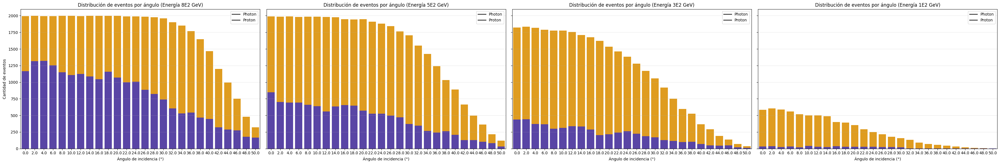

In [9]:
# Filtra los datos de Photon y Proton
df_photon = df_full[df_full['label'] == 1]
df_proton = df_full[df_full['label'] == 0]

# Obtiene las energías únicas y las ordena de mayor a menor (para que la mayor esté a la izquierda)
unique_energies = sorted(df_full['energy'].unique(), key=lambda x: float(x.replace('E', 'e')), reverse=True)

fig, axes = plt.subplots(1, len(unique_energies), figsize=(9 * len(unique_energies), 6), sharey=True)

if len(unique_energies) == 1:
    axes = [axes]  # Para que siempre sea iterable

for i, energy in enumerate(unique_energies):
    df_photon_e = df_photon[df_photon['energy'] == energy]
    df_proton_e = df_proton[df_proton['energy'] == energy]
    angle_counts_photon = df_photon_e.groupby('angle').size().reset_index(name='num_events')
    angle_counts_proton = df_proton_e.groupby('angle').size().reset_index(name='num_events')
    ax = axes[i]
    sns.barplot(data=angle_counts_photon, x='angle', y='num_events', color='orange', label='Photon', ax=ax)
    sns.barplot(data=angle_counts_proton, x='angle', y='num_events', color='blue', label='Proton', alpha=0.7, ax=ax)
    ax.set_title(f'Distribución de eventos por ángulo (Energía {energy} GeV)')
    ax.set_xlabel('Ángulo de incidencia (°)')
    ax.set_ylabel('Cantidad de eventos')
    ax.legend(['Photon', 'Proton'])
    ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()


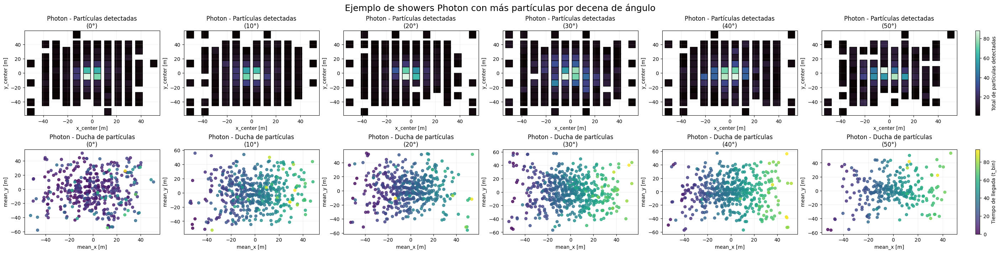

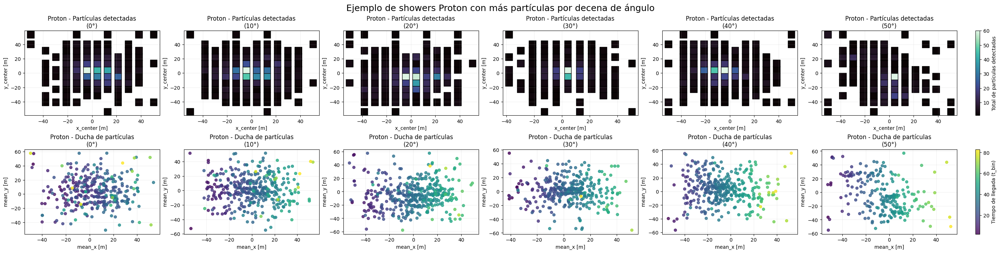

In [10]:
# --- Photon ---
angle_decenas = [0, 10, 20, 30, 40, 50]
df_photon = df_full[df_full['label'] == 1]

example_idxs_photon = []
for ang in angle_decenas:
    df_dec = df_photon[(df_photon['angle'] >= ang) & (df_photon['angle'] < ang + 10)]
    if len(df_dec) > 0:
        idx_max = df_dec['total_particles'].idxmax()
        example_idxs_photon.append(idx_max)
    else:
        example_idxs_photon.append(None)

detector_counts_list_photon = []
shower_dfs_photon = []
for idx in example_idxs_photon:
    if idx is None:
        detector_counts_list_photon.append(pd.DataFrame())
        shower_dfs_photon.append(pd.DataFrame())
        continue
    seq = df_photon.loc[idx, 'shower_data']
    df_seq = pd.DataFrame(seq, columns=[
        'detector_id', 't_bin', 'particle_count', 'mean_x', 'mean_y',
        'x_center', 'y_center', 'total_energy', 'percentage_in_condor', 'incidence_angle'
    ])
    detector_counts = df_seq.groupby(['detector_id', 'x_center', 'y_center'])['particle_count'].sum().reset_index()
    detector_counts_list_photon.append(detector_counts)
    shower_dfs_photon.append(df_seq)

fig, axes = plt.subplots(2, 6, figsize=(28, 7), sharex=False, sharey=False, constrained_layout=True)
sc_list1, sc_list2 = [], []

for i, (angle, counts, df) in enumerate(zip(angle_decenas, detector_counts_list_photon, shower_dfs_photon)):
    ax1 = axes[0, i]
    if not counts.empty:
        sc1 = ax1.scatter(
            counts['x_center'],
            counts['y_center'],
            c=counts['particle_count'],
            cmap='mako',
            s=200,
            edgecolor='k',
            marker='s'
        )
        sc_list1.append(sc1)
        ax1.set_title(f'Photon - Partículas detectadas\n({angle}°)')
        ax1.set_xlabel('x_center [m]')
        ax1.set_ylabel('y_center [m]')
        ax1.grid(alpha=0.2)
    else:
        ax1.set_visible(False)

    ax2 = axes[1, i]
    if not df.empty:
        sc2 = ax2.scatter(
            df['mean_x'],
            df['mean_y'],
            c=df['t_bin'],
            cmap='viridis',
            s=30,
            alpha=0.8
        )
        sc_list2.append(sc2)
        ax2.set_title(f'Photon - Ducha de partículas\n({angle}°)')
        ax2.set_xlabel('mean_x [m]')
        ax2.set_ylabel('mean_y [m]')
        ax2.grid(alpha=0.2)
    else:
        ax2.set_visible(False)

# Barra de color para partículas detectadas (fila 1)
if sc_list1:
    cbar1 = fig.colorbar(sc_list1[0], ax=axes[0, :], orientation='vertical', fraction=0.02, pad=0.02)
    cbar1.set_label('Total de partículas detectadas')
# Barra de color para tiempo de llegada (fila 2)
if sc_list2:
    cbar2 = fig.colorbar(sc_list2[0], ax=axes[1, :], orientation='vertical', fraction=0.02, pad=0.02)
    cbar2.set_label('Tiempo de llegada (t_bin)')

plt.suptitle('Ejemplo de showers Photon con más partículas por decena de ángulo', fontsize=18)
plt.show()

# --- Proton ---
df_proton = df_full[df_full['label'] == 0]

example_idxs_proton = []
for ang in angle_decenas:
    df_dec = df_proton[(df_proton['angle'] >= ang) & (df_proton['angle'] < ang + 10)]
    if len(df_dec) > 0:
        idx_max = df_dec['total_particles'].idxmax()
        example_idxs_proton.append(idx_max)
    else:
        example_idxs_proton.append(None)

detector_counts_list_proton = []
shower_dfs_proton = []
for idx in example_idxs_proton:
    if idx is None:
        detector_counts_list_proton.append(pd.DataFrame())
        shower_dfs_proton.append(pd.DataFrame())
        continue
    seq = df_proton.loc[idx, 'shower_data']
    df_seq = pd.DataFrame(seq, columns=[
        'detector_id', 't_bin', 'particle_count', 'mean_x', 'mean_y',
        'x_center', 'y_center', 'total_energy', 'percentage_in_condor', 'incidence_angle'
    ])
    detector_counts = df_seq.groupby(['detector_id', 'x_center', 'y_center'])['particle_count'].sum().reset_index()
    detector_counts_list_proton.append(detector_counts)
    shower_dfs_proton.append(df_seq)

fig, axes = plt.subplots(2, 6, figsize=(28, 7), sharex=False, sharey=False, constrained_layout=True)
sc_list1, sc_list2 = [], []

for i, (angle, counts, df) in enumerate(zip(angle_decenas, detector_counts_list_proton, shower_dfs_proton)):
    ax1 = axes[0, i]
    if not counts.empty:
        sc1 = ax1.scatter(
            counts['x_center'],
            counts['y_center'],
            c=counts['particle_count'],
            cmap='mako',
            s=200,
            edgecolor='k',
            marker='s'
        )
        sc_list1.append(sc1)
        ax1.set_title(f'Proton - Partículas detectadas\n({angle}°)')
        ax1.set_xlabel('x_center [m]')
        ax1.set_ylabel('y_center [m]')
        ax1.grid(alpha=0.2)
    else:
        ax1.set_visible(False)

    ax2 = axes[1, i]
    if not df.empty:
        sc2 = ax2.scatter(
            df['mean_x'],
            df['mean_y'],
            c=df['t_bin'],
            cmap='viridis',
            s=30,
            alpha=0.8
        )
        sc_list2.append(sc2)
        ax2.set_title(f'Proton - Ducha de partículas\n({angle}°)')
        ax2.set_xlabel('mean_x [m]')
        ax2.set_ylabel('mean_y [m]')
        ax2.grid(alpha=0.2)
    else:
        ax2.set_visible(False)

# Barra de color para partículas detectadas (fila 1)
if sc_list1:
    cbar1 = fig.colorbar(sc_list1[0], ax=axes[0, :], orientation='vertical', fraction=0.02, pad=0.02)
    cbar1.set_label('Total de partículas detectadas')
# Barra de color para tiempo de llegada (fila 2)
if sc_list2:
    cbar2 = fig.colorbar(sc_list2[0], ax=axes[1, :], orientation='vertical', fraction=0.02, pad=0.02)
    cbar2.set_label('Tiempo de llegada (t_bin)')

plt.suptitle('Ejemplo de showers Proton con más partículas por decena de ángulo', fontsize=18)
plt.show()

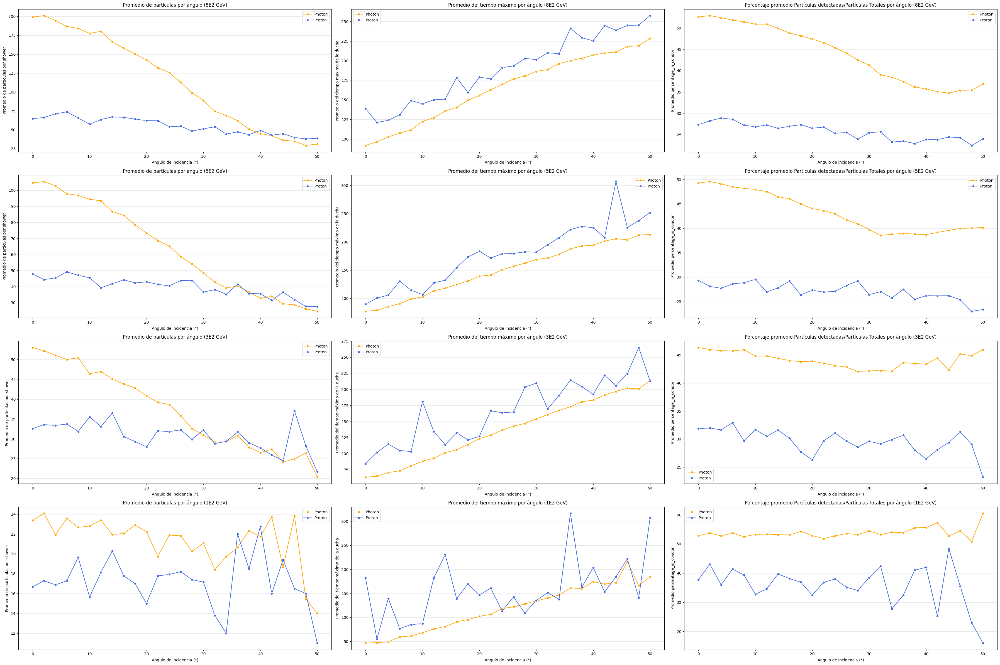

In [11]:
# Promedio de partículas, tiempo máximo y porcentaje en CONDOR por ángulo y energía, para cualquier energía leída

# Obtén las energías únicas y ordénalas de mayor a menor (para que la mayor esté a la izquierda)
unique_energies = sorted(df_photon['energy'].unique(), key=lambda x: float(x.replace('E', 'e')), reverse=True)

# Diccionarios para guardar los resultados por energía y partícula
mean_particles = {'Photon': {}, 'Proton': {}}
mean_maxtime = {'Photon': {}, 'Proton': {}}
mean_percent = {'Photon': {}, 'Proton': {}}

for energy in unique_energies:
    # Filtra por energía y partícula
    df_photon_e = df_photon[df_photon['energy'] == energy]
    df_proton_e = df_proton[df_proton['energy'] == energy]
    
    # Photon
    mean_particles['Photon'][energy] = df_photon_e.groupby('angle')['total_particles'].mean().reset_index()
    mean_maxtime['Photon'][energy]   = df_photon_e.groupby('angle')['max_time'].mean().reset_index()
    mean_percent['Photon'][energy]   = df_photon_e.groupby('angle')['shower_data'].apply(
        lambda seqs: np.mean([np.mean(seq[:,8]) for seq in seqs])
    ).reset_index(name='percentage_in_condor')
    
    # Proton
    mean_particles['Proton'][energy] = df_proton_e.groupby('angle')['total_particles'].mean().reset_index()
    mean_maxtime['Proton'][energy]   = df_proton_e.groupby('angle')['max_time'].mean().reset_index()
    mean_percent['Proton'][energy]   = df_proton_e.groupby('angle')['shower_data'].apply(
        lambda seqs: np.mean([np.mean(seq[:,8]) for seq in seqs])
    ).reset_index(name='percentage_in_condor')

fig, axes = plt.subplots(len(unique_energies), 3, figsize=(12 * 3, 6 * len(unique_energies)))

if len(unique_energies) == 1:
    axes = np.expand_dims(axes, axis=0)  # Para que siempre sea 2D

for row_idx, energy in enumerate(unique_energies):
    # Partículas promedio
    sns.lineplot(data=mean_particles['Photon'][energy], x='angle', y='total_particles', marker='o', color='orange', label='Photon', ax=axes[row_idx, 0])
    sns.lineplot(data=mean_particles['Proton'][energy], x='angle', y='total_particles', marker='o', color='royalblue', label='Proton', ax=axes[row_idx, 0])
    axes[row_idx, 0].set_title(f'Promedio de partículas por ángulo ({energy} GeV)')
    axes[row_idx, 0].set_xlabel('Ángulo de incidencia (°)')
    axes[row_idx, 0].set_ylabel('Promedio de partículas por shower')
    axes[row_idx, 0].legend()
    axes[row_idx, 0].grid(axis='y', alpha=0.3)

    # Tiempo máximo promedio
    sns.lineplot(data=mean_maxtime['Photon'][energy], x='angle', y='max_time', marker='o', color='orange', label='Photon', ax=axes[row_idx, 1])
    sns.lineplot(data=mean_maxtime['Proton'][energy], x='angle', y='max_time', marker='o', color='royalblue', label='Proton', ax=axes[row_idx, 1])
    axes[row_idx, 1].set_title(f'Promedio del tiempo máximo por ángulo ({energy} GeV)')
    axes[row_idx, 1].set_xlabel('Ángulo de incidencia (°)')
    axes[row_idx, 1].set_ylabel('Promedio del tiempo máximo de la ducha')
    axes[row_idx, 1].legend()
    axes[row_idx, 1].grid(axis='y', alpha=0.3)

    # Porcentaje promedio en CONDOR
    sns.lineplot(data=mean_percent['Photon'][energy], x='angle', y='percentage_in_condor', marker='o', color='orange', label='Photon', ax=axes[row_idx, 2])
    sns.lineplot(data=mean_percent['Proton'][energy], x='angle', y='percentage_in_condor', marker='o', color='royalblue', label='Proton', ax=axes[row_idx, 2])
    axes[row_idx, 2].set_title(f'Porcentaje promedio Partículas detectadas/Partículas Totales por ángulo ({energy} GeV)')
    axes[row_idx, 2].set_xlabel('Ángulo de incidencia (°)')
    axes[row_idx, 2].set_ylabel('Promedio percentage_in_condor')
    axes[row_idx, 2].legend()
    axes[row_idx, 2].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()


In [15]:
# Construye el DataFrame de partículas detectadas por detector, ángulo, tipo de partícula y energía
rows = []
for angle in sorted(df_full['angle'].unique()):
    for label in [0, 1]:
        df_angle_label = df_full[(df_full['angle'] == angle) & (df_full['label'] == label)]
        for _, row in df_angle_label.iterrows():
            seq = row['shower_data']
            energy = row['energy']
            df_seq = pd.DataFrame(seq, columns=[
                'detector_id', 't_bin', 'particle_count', 'mean_x', 'mean_y',
                'x_center', 'y_center', 'total_energy', 'percentage_in_condor', 'incidence_angle'
            ])
            grouped = df_seq.groupby('detector_id')['particle_count'].sum().reset_index()
            for _, g in grouped.iterrows():
                rows.append({
                    'detector_id': int(g['detector_id']),
                    'total_particles': g['particle_count'],
                    'angle': angle,
                    'label': label,
                    'energy': energy
                })
df_detector_particles_angle = pd.DataFrame(rows)

# Separa por partícula
df_photon_det = df_detector_particles_angle[df_detector_particles_angle['label'] == 1]
df_proton_det = df_detector_particles_angle[df_detector_particles_angle['label'] == 0]

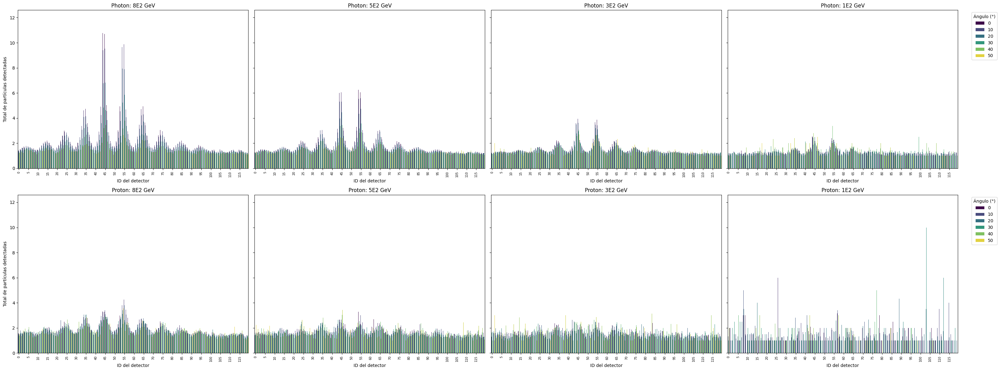

In [16]:
unique_energies = sorted(df_photon_det['energy'].unique(), key=lambda x: float(x.replace('E', 'e')), reverse=True) if 'energy' in df_photon_det.columns else energies

fig, axes = plt.subplots(2, len(unique_energies), figsize=(8 * len(unique_energies), 12), sharey=True)

for i, energy in enumerate(unique_energies):
    # Photon
    df_photon_e = df_photon_det[df_photon_det['energy'] == energy] if 'energy' in df_photon_det.columns else df_photon_det
    ax_photon = axes[0, i] if len(unique_energies) > 1 else axes[0]
    sns.barplot(
        data=df_photon_e,
        x='detector_id',
        y='total_particles',
        hue='angle',
        palette='viridis',
        errorbar=None,
        ax=ax_photon
    )
    ax_photon.set_xlabel('ID del detector')
    ax_photon.set_ylabel('Total de partículas detectadas')
    ax_photon.set_title(f'Photon: {energy} GeV')
    ax_photon.tick_params(axis='x', rotation=90, labelsize=7)
    # Mostrar solo cada 5 etiquetas
    xticks = ax_photon.get_xticks()
    xticks_to_show = xticks[::5]
    ax_photon.set_xticks(xticks_to_show)
    labels_to_show = [int(tick) for tick in xticks_to_show]
    ax_photon.set_xticklabels(labels_to_show, rotation=90, fontsize=7)
    handles, labels = ax_photon.get_legend_handles_labels()
    if i == len(unique_energies) - 1:
        ax_photon.legend(handles, labels, title='Ángulo (°)', bbox_to_anchor=(1.05, 1), loc='upper left')
    else:
        ax_photon.get_legend().remove()

    # Proton
    df_proton_e = df_proton_det[df_proton_det['energy'] == energy] if 'energy' in df_proton_det.columns else df_proton_det
    ax_proton = axes[1, i] if len(unique_energies) > 1 else axes[1]
    sns.barplot(
        data=df_proton_e,
        x='detector_id',
        y='total_particles',
        hue='angle',
        palette='viridis',
        errorbar=None,
        ax=ax_proton
    )
    ax_proton.set_xlabel('ID del detector')
    ax_proton.set_ylabel('Total de partículas detectadas')
    ax_proton.set_title(f'Proton: {energy} GeV')
    ax_proton.tick_params(axis='x', rotation=90, labelsize=7)
    xticks = ax_proton.get_xticks()
    xticks_to_show = xticks[::5]
    ax_proton.set_xticks(xticks_to_show)
    labels_to_show = [int(tick) for tick in xticks_to_show]
    ax_proton.set_xticklabels(labels_to_show, rotation=90, fontsize=7)
    handles, labels = ax_proton.get_legend_handles_labels()
    if i == len(unique_energies) - 1:
        ax_proton.legend(handles, labels, title='Ángulo (°)', bbox_to_anchor=(1.05, 1), loc='upper left')
    else:
        ax_proton.get_legend().remove()

plt.tight_layout()
plt.show()

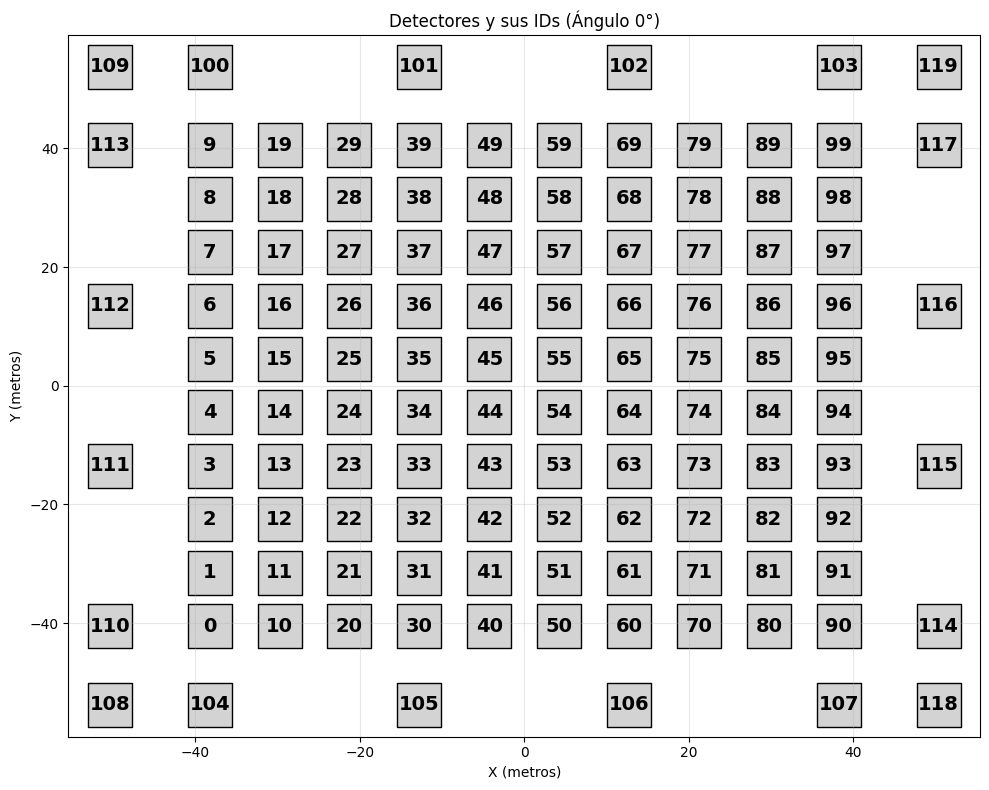

In [17]:
# Define los IDs y posiciones de los detectores centrales y periféricos
central_ids = list(range(0, 100))
peripheral_ids = list(range(100, 120))

# Agrupa por detector y suma partículas para un ángulo específico (ejemplo: ángulo 0)
angle_to_plot = 0
df_angle = df_full[df_full['angle'] == angle_to_plot]
detector_particles = []
for idx, row in df_angle.iterrows():
    seq = row['shower_data']
    df_seq = pd.DataFrame(seq, columns=[
        'detector_id', 't_bin', 'particle_count', 'mean_x', 'mean_y',
        'x_center', 'y_center', 'total_energy', 'percentage_in_condor', 'incidence_angle'
    ])
    grouped = df_seq.groupby(['detector_id', 'x_center', 'y_center'])['particle_count'].sum().reset_index()
    detector_particles.append(grouped)
df_det_particles = pd.concat(detector_particles, ignore_index=True)
df_det_particles = df_det_particles.groupby(['detector_id', 'x_center', 'y_center'])['particle_count'].sum().reset_index()

plt.figure(figsize=(10, 8))
plt.scatter(
    df_det_particles['x_center'], df_det_particles['y_center'],
    s=1000, c='lightgray', edgecolor='k', marker='s'
)
for _, row in df_det_particles.iterrows():
    plt.text(row['x_center'], row['y_center'], int(row['detector_id']),
             ha='center', va='center', fontsize=14, fontweight='bold')

plt.xlabel('X (metros)')
plt.ylabel('Y (metros)')
plt.title(f'Detectores y sus IDs (Ángulo {angle_to_plot}°)')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


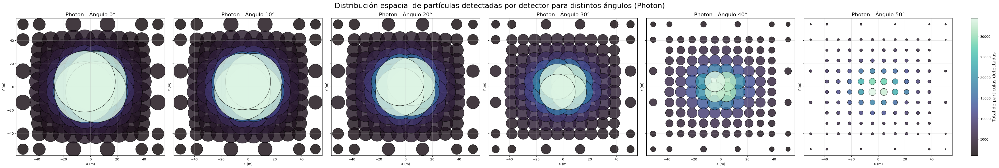

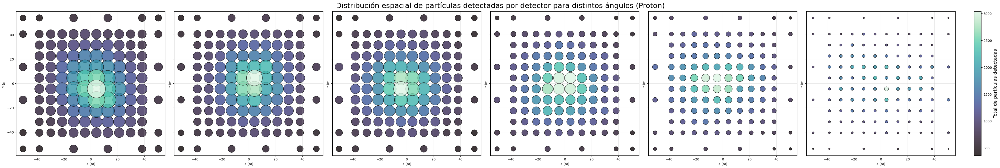

In [24]:
# --- PARTICULAS DETECTADAS POR ÁNGULO ---
angle_decenas = [0, 10, 20, 30, 40, 50]

# Photon
df_photon = df_full[df_full['label'] == 1]
fig, axes = plt.subplots(1, 6, figsize=(42, 7), sharex=True, sharey=True, constrained_layout=True)
scatter_plots = []

for i, angle_to_plot in enumerate(angle_decenas):
    ax = axes[i]
    df_angle = df_photon[df_photon['angle'] == angle_to_plot]
    detector_particles = []
    for idx, row in df_angle.iterrows():
        seq = row['shower_data']
        df_seq = pd.DataFrame(seq, columns=[
            'detector_id', 't_bin', 'particle_count', 'mean_x', 'mean_y',
            'x_center', 'y_center', 'total_energy', 'percentage_in_condor', 'incidence_angle'
        ])
        grouped = df_seq.groupby(['detector_id', 'x_center', 'y_center'])['particle_count'].sum().reset_index()
        detector_particles.append(grouped)
    if detector_particles:
        df_det_particles = pd.concat(detector_particles, ignore_index=True)
        df_det_particles = df_det_particles.groupby(['detector_id', 'x_center', 'y_center'])['particle_count'].sum().reset_index()
        df_det_particles = df_det_particles.sort_values('particle_count')
    else:
        df_det_particles = pd.DataFrame(columns=['detector_id', 'x_center', 'y_center', 'particle_count'])

    sc = ax.scatter(
        df_det_particles['x_center'], df_det_particles['y_center'],
        s=df_det_particles['particle_count'], c=df_det_particles['particle_count'],
        cmap='mako', alpha=0.8, edgecolor='k'
    )
    scatter_plots.append(sc)
    # for _, row in df_det_particles.iterrows():
    #     ax.text(row['x_center'], row['y_center'], int(row['detector_id']),
    #             ha='center', va='center', fontsize=8, fontweight='bold')
    ax.set_title(f'Photon - Ángulo {angle_to_plot}°', fontsize=16)
    ax.set_xlabel('X (m)')
    ax.set_ylabel('Y (m)')
    ax.grid(alpha=0.3)

cbar = fig.colorbar(scatter_plots[0], ax=axes, orientation='vertical', fraction=0.02, pad=0.02)
cbar.set_label('Total de partículas detectadas', fontsize=14)
plt.suptitle('Distribución espacial de partículas detectadas por detector para distintos ángulos (Photon)', fontsize=22)
plt.show()

# --- Proton ---
df_proton = df_full[df_full['label'] == 0]
fig2, axes2 = plt.subplots(1, 6, figsize=(42, 7), sharex=True, sharey=True, constrained_layout=True)
scatter_plots_proton = []

for i, angle_to_plot in enumerate(angle_decenas):
    ax = axes2[i]
    df_angle = df_proton[df_proton['angle'] == angle_to_plot]
    detector_particles = []
    for idx, row in df_angle.iterrows():
        seq = row['shower_data']
        df_seq = pd.DataFrame(seq, columns=[
            'detector_id', 't_bin', 'particle_count', 'mean_x', 'mean_y',
            'x_center', 'y_center', 'total_energy', 'percentage_in_condor', 'incidence_angle'
        ])
        grouped = df_seq.groupby(['detector_id', 'x_center', 'y_center'])['particle_count'].sum().reset_index()
        detector_particles.append(grouped)
    if detector_particles:
        df_det_particles = pd.concat(detector_particles, ignore_index=True)
        df_det_particles = df_det_particles.groupby(['detector_id', 'x_center', 'y_center'])['particle_count'].sum().reset_index()
        df_det_particles = df_det_particles.sort_values('particle_count')
    else:
        df_det_particles = pd.DataFrame(columns=['detector_id', 'x_center', 'y_center', 'particle_count'])

    sc = ax.scatter(
        df_det_particles['x_center'], df_det_particles['y_center'],
        s=df_det_particles['particle_count'], c=df_det_particles['particle_count'],
        cmap='mako', alpha=0.8, edgecolor='k'
    )
    scatter_plots_proton.append(sc)
    # for _, row in df_det_particles.iterrows():
    #     ax.text(row['x_center'], row['y_center'], int(row['detector_id']),
    #             ha='center', va='center', fontsize=8, fontweight='bold')
    # ax.set_title(f'Proton - Ángulo {angle_to_plot}°', fontsize=16)
    ax.set_xlabel('X (m)')
    ax.set_ylabel('Y (m)')
    ax.grid(alpha=0.3)

cbar2 = fig2.colorbar(scatter_plots_proton[0], ax=axes2, orientation='vertical', fraction=0.02, pad=0.02)
cbar2.set_label('Total de partículas detectadas', fontsize=14)
plt.suptitle('Distribución espacial de partículas detectadas por detector para distintos ángulos (Proton)', fontsize=22)
plt.show()

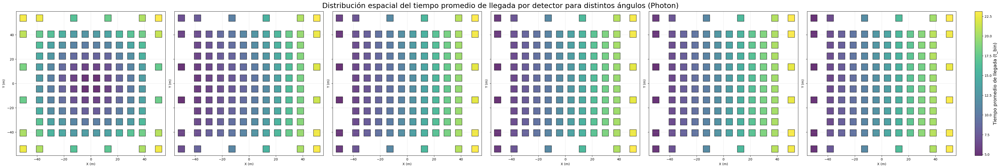

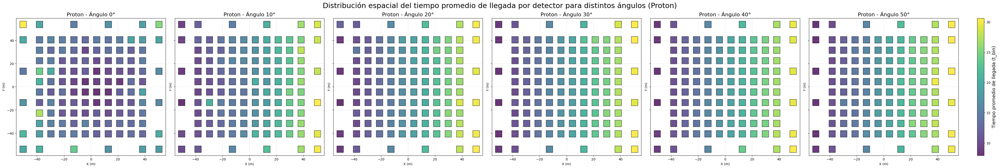

In [25]:
# --- TIEMPO DE LLEGADA POR ÁNGULO ---
# Photon
fig3, axes3 = plt.subplots(1, 6, figsize=(42, 7), sharex=True, sharey=True, constrained_layout=True)
scatter_plots_time = []

for i, angle_to_plot in enumerate(angle_decenas):
    ax = axes3[i]
    df_angle = df_photon[df_photon['angle'] == angle_to_plot]
    detector_times = []
    for idx, row in df_angle.iterrows():
        seq = row['shower_data']
        df_seq = pd.DataFrame(seq, columns=[
            'detector_id', 't_bin', 'particle_count', 'mean_x', 'mean_y',
            'x_center', 'y_center', 'total_energy', 'percentage_in_condor', 'incidence_angle'
        ])
        grouped = df_seq.groupby(['detector_id', 'x_center', 'y_center'])['t_bin'].mean().reset_index()
        detector_times.append(grouped)
    if detector_times:
        df_det_times = pd.concat(detector_times, ignore_index=True)
        df_det_times = df_det_times.groupby(['detector_id', 'x_center', 'y_center'])['t_bin'].mean().reset_index()
    else:
        df_det_times = pd.DataFrame(columns=['detector_id', 'x_center', 'y_center', 't_bin'])

    sc_time = ax.scatter(
        df_det_times['x_center'], df_det_times['y_center'],
        s=400, c=df_det_times['t_bin'],
        cmap='viridis', alpha=0.8, edgecolor='k', marker='s' 
    )
    scatter_plots_time.append(sc_time)
    ax.set_xlabel('X (m)')
    ax.set_ylabel('Y (m)')
    ax.grid(alpha=0.3)

cbar3 = fig3.colorbar(scatter_plots_time[0], ax=axes3, orientation='vertical', fraction=0.02, pad=0.02)
cbar3.set_label('Tiempo promedio de llegada (t_bin)', fontsize=14)
plt.suptitle('Distribución espacial del tiempo promedio de llegada por detector para distintos ángulos (Photon)', fontsize=22)
plt.show()

# Proton
fig4, axes4 = plt.subplots(1, 6, figsize=(42, 7), sharex=True, sharey=True, constrained_layout=True)
scatter_plots_time_proton = []

for i, angle_to_plot in enumerate(angle_decenas):
    ax = axes4[i]
    df_angle = df_proton[df_proton['angle'] == angle_to_plot]
    detector_times = []
    for idx, row in df_angle.iterrows():
        seq = row['shower_data']
        df_seq = pd.DataFrame(seq, columns=[
            'detector_id', 't_bin', 'particle_count', 'mean_x', 'mean_y',
            'x_center', 'y_center', 'total_energy', 'percentage_in_condor', 'incidence_angle'
        ])
        grouped = df_seq.groupby(['detector_id', 'x_center', 'y_center'])['t_bin'].mean().reset_index()
        detector_times.append(grouped)
    if detector_times:
        df_det_times = pd.concat(detector_times, ignore_index=True)
        df_det_times = df_det_times.groupby(['detector_id', 'x_center', 'y_center'])['t_bin'].mean().reset_index()
    else:
        df_det_times = pd.DataFrame(columns=['detector_id', 'x_center', 'y_center', 't_bin'])

    sc_time = ax.scatter(
        df_det_times['x_center'], df_det_times['y_center'],
        s=400, c=df_det_times['t_bin'],
        cmap='viridis', alpha=0.8, edgecolor='k', marker='s' 
    )
    scatter_plots_time_proton.append(sc_time)
    # for _, row in df_det_times.iterrows():
    #     ax.text(row['x_center'], row['y_center'], int(row['detector_id']),
    #             ha='center', va='center', fontsize=8, fontweight='bold')
    ax.set_title(f'Proton - Ángulo {angle_to_plot}°', fontsize=16)
    ax.set_xlabel('X (m)')
    ax.set_ylabel('Y (m)')
    ax.grid(alpha=0.3)

cbar4 = fig4.colorbar(scatter_plots_time_proton[0], ax=axes4, orientation='vertical', fraction=0.02, pad=0.02)
cbar4.set_label('Tiempo promedio de llegada (t_bin)', fontsize=14)
plt.suptitle('Distribución espacial del tiempo promedio de llegada por detector para distintos ángulos (Proton)', fontsize=22)
plt.show()

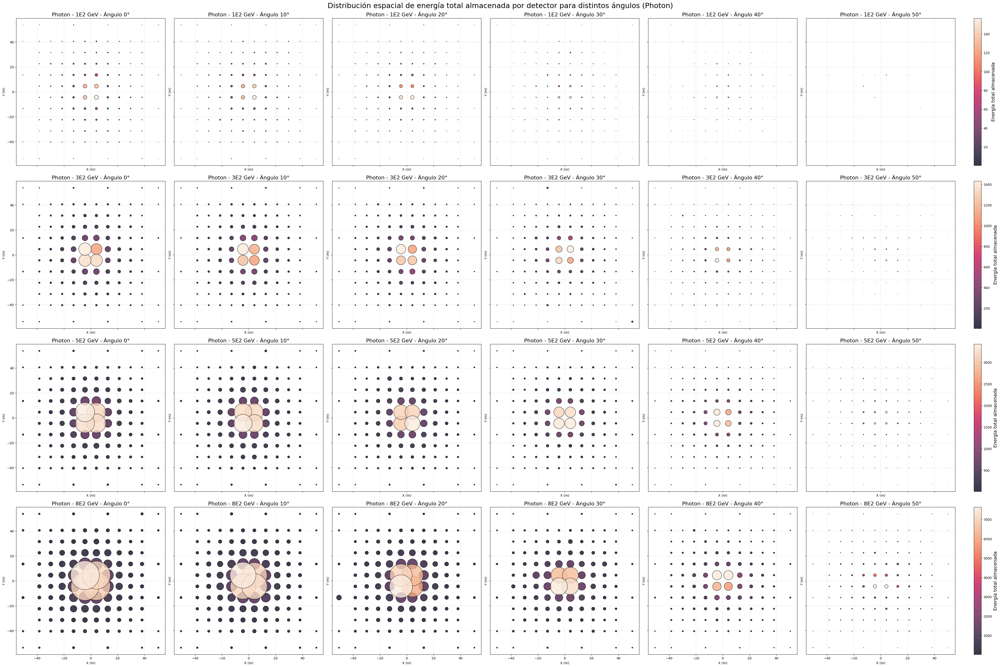

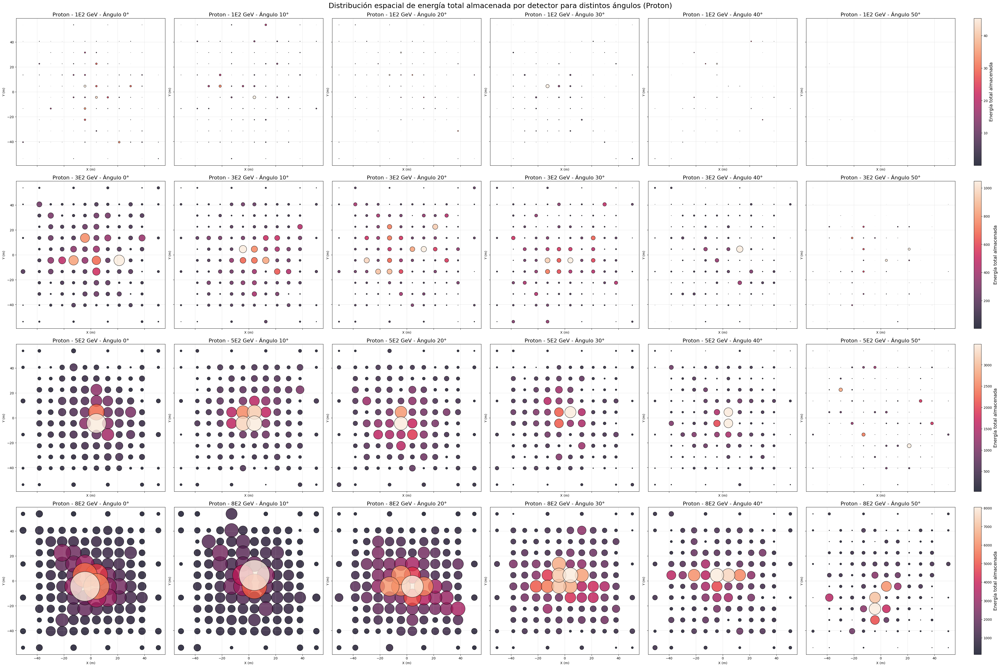

In [27]:
# --- ENERGÍA TOTAL POR ÁNGULO Y ENERGÍA INCIDENTE ---

for particle, df_particle in zip(['Photon', 'Proton'], [df_photon, df_proton]):
    fig, axes = plt.subplots(len(energies), 6, figsize=(42, 7 * len(energies)), sharex=True, sharey=True, constrained_layout=True)
    for row_idx, energy in enumerate(energies):
        scatter_plots_energy = []
        df_energy = df_particle[df_particle['energy'] == energy]
        for col_idx, angle_to_plot in enumerate(angle_decenas):
            ax = axes[row_idx, col_idx]
            df_angle = df_energy[df_energy['angle'] == angle_to_plot]
            detector_energy = []
            for idx, row in df_angle.iterrows():
                seq = row['shower_data']
                df_seq = pd.DataFrame(seq, columns=[
                    'detector_id', 't_bin', 'particle_count', 'mean_x', 'mean_y',
                    'x_center', 'y_center', 'total_energy', 'percentage_in_condor', 'incidence_angle'
                ])
                grouped = df_seq.groupby(['detector_id', 'x_center', 'y_center'])['total_energy'].sum().reset_index()
                detector_energy.append(grouped)
            if detector_energy:
                df_det_energy = pd.concat(detector_energy, ignore_index=True)
                df_det_energy = df_det_energy.groupby(['detector_id', 'x_center', 'y_center'])['total_energy'].sum().reset_index()
                df_det_energy = df_det_energy.sort_values('total_energy')
            else:
                df_det_energy = pd.DataFrame(columns=['detector_id', 'x_center', 'y_center', 'total_energy'])

            sc_energy = ax.scatter(
                df_det_energy['x_center'], df_det_energy['y_center'],
                s=df_det_energy['total_energy'], c=df_det_energy['total_energy'],
                cmap='rocket', alpha=0.8, edgecolor='k'
            )
            scatter_plots_energy.append(sc_energy)
            ax.set_title(f'{particle} - {energy} GeV - Ángulo {angle_to_plot}°', fontsize=16)
            ax.set_xlabel('X (m)')
            ax.set_ylabel('Y (m)')
            ax.grid(alpha=0.3)

        # Barra de color para cada fila (energía)
        cbar = fig.colorbar(scatter_plots_energy[0], ax=axes[row_idx, :], orientation='vertical', fraction=0.02, pad=0.02)
        cbar.set_label('Energía total almacenada', fontsize=14)

    plt.suptitle(f'Distribución espacial de energía total almacenada por detector para distintos ángulos ({particle})', fontsize=22)
    plt.show()


In [28]:
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Ordena todas las secuencias por t_bin antes de hacer el padding
X = []
y_angle = []
y_label = []
y_energy = []
for idx, row in df_full.iterrows():
    seq = row['shower_data']
    # Ordena la secuencia por t_bin (columna 1)
    seq_ordered = seq[np.argsort(seq[:, 1])]
    # Extrae las columnas relevantes después de ordenar
    # Extrae las columnas relevantes: detector_id, x_center, y_center, particle_count, t_bin, total_energy
    X.append(seq_ordered[:, [0, 2, 1, 7]])
    y_angle.append(row['angle'])
    y_label.append(row['label'])  # 0: Proton, 1: Photon
    y_energy.append(row['energy'])  # Energía incidente

# Aplica el padding después de ordenar
X_padded = pad_sequences(X, padding='post', dtype='float32')
y_angle = np.array(y_angle)
y_label = np.array(y_label)
y_energy = np.array(y_energy)

indices = np.arange(len(X_padded))

# Puedes estratificar por ángulo y partícula para mantener la proporción en cada set
stratify_labels = list(zip(y_angle, y_label))

train_idx, temp_idx = train_test_split(
    indices,
    shuffle=True,
    stratify=stratify_labels,
    test_size=0.4,
    random_state=42
)
val_idx, test_idx = train_test_split(
    temp_idx,
    shuffle=True,
    stratify=[stratify_labels[i] for i in temp_idx],
    test_size=0.5,
    random_state=42
)

# Verifica que los índices no se repitan
assert len(set(train_idx) & set(val_idx)) == 0
assert len(set(train_idx) & set(test_idx)) == 0
assert len(set(val_idx) & set(test_idx)) == 0

# Asigna los conjuntos
X_train = X_padded[train_idx]
y_angle_train = y_angle[train_idx]
y_label_train = y_label[train_idx]
y_energy_train = y_energy[train_idx]

X_val   = X_padded[val_idx]
y_angle_val   = y_angle[val_idx]
y_label_val   = y_label[val_idx]
y_energy_val  = y_energy[val_idx]

X_test  = X_padded[test_idx]
y_angle_test  = y_angle[test_idx]
y_label_test  = y_label[test_idx]
y_energy_test = y_energy[test_idx]

print(f"Total original: {len(X_padded)}")
print(f"Train: {len(X_train)}, Validation: {len(X_val)}, Test: {len(X_test)}")
print(f"Sum: {len(X_train) + len(X_val) + len(X_test)}")

Total original: 157899
Train: 94739, Validation: 31580, Test: 31580
Sum: 157899


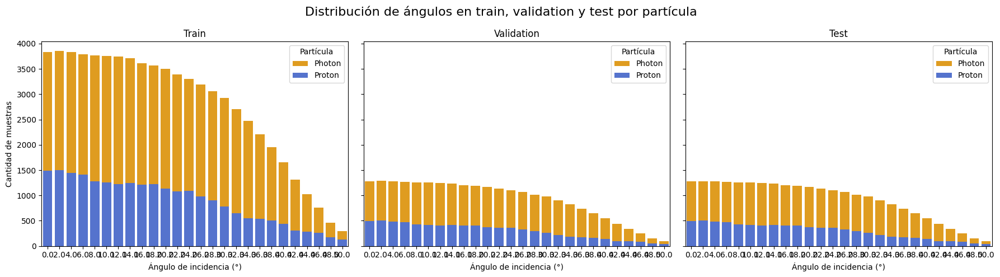

In [29]:
# Visualización de la distribución de ángulos en train, val y test, separados por partícula
splits = [
    (y_angle_train, y_label_train, "Train"),
    (y_angle_val, y_label_val, "Validation"),
    (y_angle_test, y_label_test, "Test"),
]

fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

for col, (y_ang, y_lbl, title) in enumerate(splits):
    ax = axes[col]
    df_tmp = pd.DataFrame({'angle': y_ang, 'label': y_lbl})
    sns.countplot(data=df_tmp[df_tmp['label'] == 1], x='angle', ax=ax, color='orange', label='Photon')
    sns.countplot(data=df_tmp[df_tmp['label'] == 0], x='angle', ax=ax, color='royalblue', label='Proton')
    ax.set_title(title)
    ax.set_xlabel("Ángulo de incidencia (°)")
    ax.set_ylabel("Cantidad de muestras")
    ax.legend(title="Partícula")

plt.suptitle('Distribución de ángulos en train, validation y test por partícula', fontsize=16)
plt.tight_layout()
plt.show()

In [30]:
# Selecciona un índice de ejemplo del conjunto de entrenamiento
example_idx = 0

# Obtén la secuencia padded, el ángulo y el tipo de partícula correspondiente
seq_example = X_train[example_idx]
angle_example = y_angle_train[example_idx]
energy_example = y_energy_train[example_idx]
label_example = y_label_train[example_idx]
particle_example = 'Photon' if label_example == 1 else 'Proton'

# Convierte la secuencia a DataFrame y ordena por t_bin
df_seq_example = pd.DataFrame(seq_example, columns=[
    'detector_id', 'particle_count', 't_bin', 'total_energy'
])

print(f"Ángulo de incidencia (train): {angle_example}°")
print(f"Partícula: {particle_example}")
print(f"Energía incidente: {energy_example} GeV")
display(df_seq_example)

Ángulo de incidencia (train): 18.0°
Partícula: Proton
Energía incidente: 5E2 GeV


,detector_id,particle_count,t_bin,total_energy
0,2.0,1.0,23.0,0.003152
1,32.0,1.0,23.0,0.069458
2,35.0,1.0,27.0,0.044982
3,47.0,1.0,35.0,0.089306
4,52.0,1.0,36.0,29.303785
...,...,...,...,...
535,0.0,0.0,0.0,0.000000
536,0.0,0.0,0.0,0.000000
537,0.0,0.0,0.0,0.000000
538,0.0,0.0,0.0,0.000000


In [31]:
# Calcula la longitud máxima de las secuencias para el padding y el modelo
maxlen = max([seq.shape[0] for seq in X])
print(f"Longitud máxima de secuencia (maxlen): {maxlen}")

Longitud máxima de secuencia (maxlen): 540


In [ ]:
from tensorflow.keras import Input, Model, layers, callbacks
import tensorflow as tf

# --- Entrada ---
input_seq = Input(shape=(maxlen, 4), name="seq_input")  # 4 features: detector_id, particle_count, t_bin, total_energy
x = layers.Masking(mask_value=0.0)(input_seq)

# --- Bloques convolucionales con BN ---
for i, (filt, ksize) in enumerate(zip([32, 64, 128, 256, 512], [2, 2, 4, 6, 6])):
    x = layers.Conv1D(filt, ksize, padding='same', activation='elu', name=f'conv_{i}')(x)
    x = layers.MaxPooling1D(pool_size=2, padding='same', name=f'pool_{i}')(x)
    x = layers.BatchNormalization(name=f'bn_{i}')(x)

# --- Capa de atención compartida ---
attn_shared = layers.MultiHeadAttention(num_heads=3, key_dim=64, name='shared_mha')(x, x)
x_shared = layers.Add(name='shared_add')([x, attn_shared])
x_shared = layers.LayerNormalization(name='shared_norm')(x_shared)

# --- Rama auxiliar por tarea ---
def build_branch(x, name_prefix):
    ff = layers.Dense(64, activation='elu', name=f"{name_prefix}_dense1")(x)
    ff = layers.Dense(512, name=f"{name_prefix}_dense2")(ff)
    x = layers.Add(name=f"{name_prefix}_add")([x, ff])
    x = layers.LayerNormalization(name=f"{name_prefix}_norm")(x)
    x = layers.GlobalAveragePooling1D(name=f"{name_prefix}_gap")(x)
    x = layers.Dropout(0.5, name=f"{name_prefix}_drop")(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn")(x)
    return x

# --- Ramas para cada tarea ---
x_class  = build_branch(x_shared, "branch_class")
x_angle  = build_branch(x_shared, "branch_angle")
x_energy = build_branch(x_shared, "branch_energy")

# --- Salidas ---
out_class  = layers.Dense(64, activation='elu')(x_class)
out_class  = layers.Dense(1, activation='sigmoid', name='particle_output')(out_class)

out_angle  = layers.Dense(64, activation='elu')(x_angle)
out_angle  = layers.Dense(1, activation='linear', name='angle_output')(out_angle)

# La salida de energía ahora tiene una cantidad variable de clases
num_energy_classes = len(unique_energies)  # Calcula el número de clases de energía
out_energy = layers.Dense(64, activation='elu')(x_energy)
out_energy = layers.Dense(num_energy_classes, activation='softmax', name='energy_output')(out_energy)

# --- Modelo completo ---
model_multi = Model(inputs=input_seq, outputs=[out_class, out_angle, out_energy])

cb_early = callbacks.EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
cb_rl = callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)

# Prepara las etiquetas de energía de forma automática (0: menor energía, 1: siguiente, ..., n-1: mayor energía)
energy_map = {e: i for i, e in enumerate(unique_energies)}
y_energy_train_bin = np.array([energy_map[e] for e in y_energy_train])
y_energy_val_bin   = np.array([energy_map[e] for e in y_energy_val])

# Compilar modelo multitarea
model_multi.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.00035),
    loss={
        'particle_output': 'binary_crossentropy',
        'angle_output': 'mse',
        'energy_output': 'sparse_categorical_crossentropy'
    },
    metrics={
        'particle_output': ['accuracy'],
        'angle_output': ['mae'],
        'energy_output': ['accuracy']
    }
)

# Entrenamiento
history_multi = model_multi.fit(
    x={'seq_input': X_train},
    y={
        'particle_output': y_label_train,
        'angle_output': y_angle_train,
        'energy_output': y_energy_train_bin
    },
    validation_data=(
        {'seq_input': X_val},
        {
            'particle_output': y_label_val,
            'angle_output': y_angle_val,
            'energy_output': y_energy_val_bin
        }
    ),
    epochs=500,
    batch_size=64,
    callbacks=[cb_early, cb_rl],
    verbose=1
)

print("Modelo multitarea (clasificación partícula, regresión de ángulo y clasificación de energía) entrenado.")

Epoch 1/500
1481/1481 [==============================] - 57s 35ms/step - loss: 28.2928 - particle_output_loss: 0.5387 - angle_output_loss: 26.5754 - energy_output_loss: 1.1784 - particle_output_accuracy: 0.7544 - angle_output_mae: 3.4226 - energy_output_accuracy: 0.4449 - val_loss: 12.7833 - val_particle_output_loss: 0.5228 - val_angle_output_loss: 11.1284 - val_energy_output_loss: 1.1318 - val_particle_output_accuracy: 0.7476 - val_angle_output_mae: 2.2443 - val_energy_output_accuracy: 0.4593 - lr: 3.5000e-04
Epoch 2/500
1481/1481 [==============================] - 53s 36ms/step - loss: 12.6307 - particle_output_loss: 0.4956 - angle_output_loss: 11.0394 - energy_output_loss: 1.0958 - particle_output_accuracy: 0.7804 - angle_output_mae: 2.3563 - energy_output_accuracy: 0.4698 - val_loss: 9.9110 - val_particle_output_loss: 0.4764 - val_angle_output_loss: 8.3887 - val_energy_output_loss: 1.0459 - val_particle_output_accuracy: 0.7964 - val_angle_output_mae: 1.9901 - val_energy_output_accu

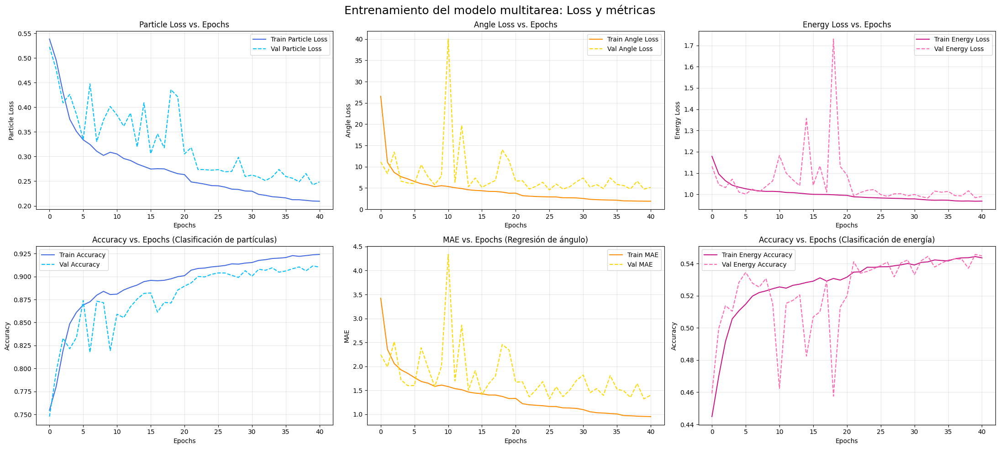

In [37]:
fig, axes = plt.subplots(2, 3, figsize=(22, 10))

# 1a. Particle Loss
axes[0, 0].plot(history_multi.history['particle_output_loss'], label='Train Particle Loss', color='royalblue')
axes[0, 0].plot(history_multi.history['val_particle_output_loss'], label='Val Particle Loss', color='deepskyblue', linestyle='--')
axes[0, 0].set_xlabel('Epochs')
axes[0, 0].set_ylabel('Particle Loss')
axes[0, 0].set_title('Particle Loss vs. Epochs')
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# 1b. Angle Loss
axes[0, 1].plot(history_multi.history['angle_output_loss'], label='Train Angle Loss', color='darkorange')
axes[0, 1].plot(history_multi.history['val_angle_output_loss'], label='Val Angle Loss', color='gold', linestyle='--')
axes[0, 1].set_xlabel('Epochs')
axes[0, 1].set_ylabel('Angle Loss')
axes[0, 1].set_title('Angle Loss vs. Epochs')
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

# 1c. Energy Loss
axes[0, 2].plot(history_multi.history['energy_output_loss'], label='Train Energy Loss', color='mediumvioletred')
axes[0, 2].plot(history_multi.history['val_energy_output_loss'], label='Val Energy Loss', color='hotpink', linestyle='--')
axes[0, 2].set_xlabel('Epochs')
axes[0, 2].set_ylabel('Energy Loss')
axes[0, 2].set_title('Energy Loss vs. Epochs')
axes[0, 2].legend()
axes[0, 2].grid(alpha=0.3)

# 2a. Particle Accuracy
axes[1, 0].plot(history_multi.history['particle_output_accuracy'], label='Train Accuracy', color='royalblue')
axes[1, 0].plot(history_multi.history['val_particle_output_accuracy'], label='Val Accuracy', color='deepskyblue', linestyle='--')
axes[1, 0].set_xlabel('Epochs')
axes[1, 0].set_ylabel('Accuracy')
axes[1, 0].set_title('Accuracy vs. Epochs (Clasificación de partículas)')
axes[1, 0].legend()
axes[1, 0].grid(alpha=0.3)

# 2b. Angle MAE
axes[1, 1].plot(history_multi.history['angle_output_mae'], label='Train MAE', color='darkorange')
axes[1, 1].plot(history_multi.history['val_angle_output_mae'], label='Val MAE', color='gold', linestyle='--')
axes[1, 1].set_xlabel('Epochs')
axes[1, 1].set_ylabel('MAE')
axes[1, 1].set_title('MAE vs. Epochs (Regresión de ángulo)')
axes[1, 1].legend()
axes[1, 1].grid(alpha=0.3)

# 2c. Energy Accuracy
axes[1, 2].plot(history_multi.history['energy_output_accuracy'], label='Train Energy Accuracy', color='mediumvioletred')
axes[1, 2].plot(history_multi.history['val_energy_output_accuracy'], label='Val Energy Accuracy', color='hotpink', linestyle='--')
axes[1, 2].set_xlabel('Epochs')
axes[1, 2].set_ylabel('Accuracy')
axes[1, 2].set_title('Accuracy vs. Epochs (Clasificación de energía)')
axes[1, 2].legend()
axes[1, 2].grid(alpha=0.3)

plt.suptitle('Entrenamiento del modelo multitarea: Loss y métricas', fontsize=18)
plt.tight_layout()
plt.show()

In [38]:
# Predicciones de clasificación (test)
y_pred_class = model_multi.predict({'seq_input': X_test})[0].ravel()
y_pred_class_bin = (y_pred_class > 0.5).astype(int)

# Predicciones de regresión de ángulo (test)
y_pred_angle = model_multi.predict({'seq_input': X_test})[1].ravel()

# Predicciones de clasificación de energía (test)
y_pred_energy = model_multi.predict({'seq_input': X_test})[2]

# Determina el mapeo de energías (mayor energía a la izquierda)
unique_energies_sorted = sorted(np.unique(np.concatenate([y_energy_train, y_energy_val, y_energy_test])), key=lambda x: float(x.replace('E', 'e')), reverse=True)
energy_map_test = {e: i for i, e in enumerate(unique_energies_sorted)}
y_energy_test_bin = np.array([energy_map_test[e] for e in y_energy_test])

# Si hay más de dos clases de energía, utiliza la salida de energía como una clasificación multiclase
if len(unique_energies_sorted) > 2:
    y_pred_energy_bin = np.argmax(y_pred_energy, axis=1)
else:
    # Si hay solo dos clases, utiliza un umbral para convertir las probabilidades en etiquetas binarias
    y_pred_energy_bin = (y_pred_energy > 0.5).astype(int)

987/987 [==============================] - 9s 9ms/step


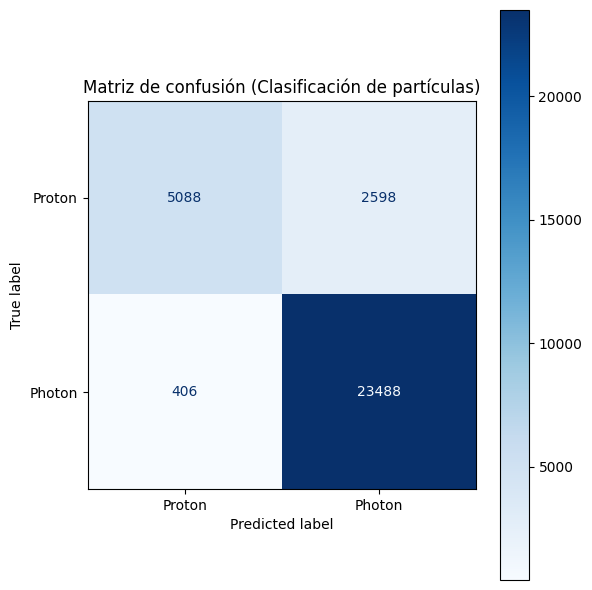

In [39]:
cm = confusion_matrix(y_label_test, y_pred_class_bin)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Proton', 'Photon'])
fig, ax = plt.subplots(figsize=(6, 6))
disp.plot(ax=ax, cmap='Blues', values_format='d')
plt.title('Matriz de confusión (Clasificación de partículas)')
plt.tight_layout()
plt.show()

In [1]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Obtén las energías únicas y ordénalas (como en el entrenamiento)
unique_energies_sorted = sorted(np.unique(np.concatenate([y_energy_train, y_energy_val, y_energy_test])), key=lambda x: float(x.replace('E', 'e')), reverse=False)
energy_labels = [str(e) for e in unique_energies_sorted]

# Genera la matriz de confusión para múltiples clases
cm = confusion_matrix(y_energy_test_bin, y_pred_energy_bin)

# Visualiza la matriz de confusión
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=energy_labels)
fig, ax = plt.subplots(figsize=(6, 6))
disp.plot(ax=ax, cmap='Blues', values_format='d')
plt.title('Matriz de confusión (Clasificación de energía incidente)')
plt.tight_layout()
plt.show()

NameError: name 'y_energy_train' is not defined

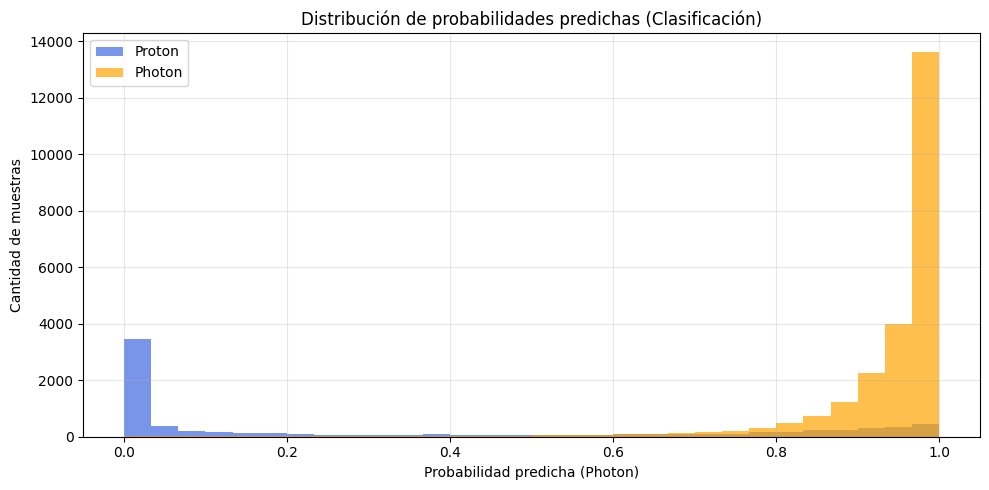

In [44]:
plt.figure(figsize=(10, 5))
plt.hist(y_pred_class[y_label_test == 0], bins=30, alpha=0.7, label='Proton', color='royalblue')
plt.hist(y_pred_class[y_label_test == 1], bins=30, alpha=0.7, label='Photon', color='orange')
plt.xlabel('Probabilidad predicha (Photon)')
plt.ylabel('Cantidad de muestras')
plt.title('Distribución de probabilidades predichas (Clasificación)')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

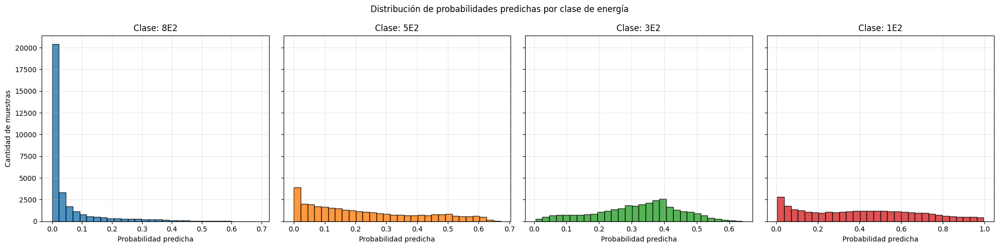

In [ ]:
fig, axes = plt.subplots(1, 4, figsize=(20, 5), sharey=True)

for i, energy_label in enumerate(unique_energies_sorted):
    ax = axes[i]
    ax.hist(
        y_pred_energy[:, i],
        bins=30,
        alpha=0.8,
        color='C'+str(i),
        edgecolor='black'
    )
    ax.set_title(f'Clase: {energy_label}')
    ax.set_xlabel('Probabilidad predicha')
    if i == 0:
        ax.set_ylabel('Cantidad de muestras')
    ax.grid(alpha=0.3)

plt.suptitle('Distribución de probabilidades predichas por clase de energía')
plt.tight_layout()
plt.show()

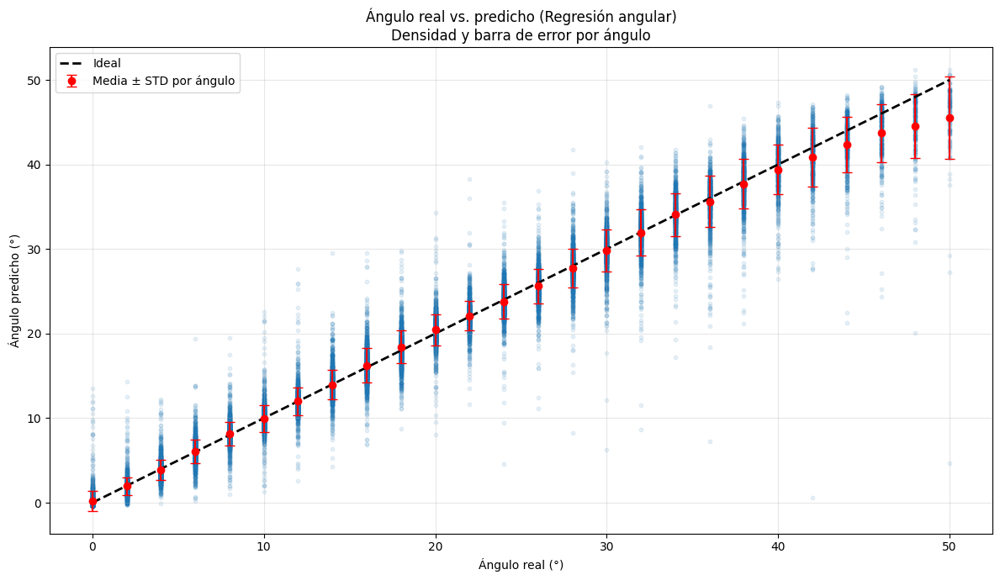

In [48]:
import pandas as pd

# Agrupa las predicciones por ángulo real
df_pred = pd.DataFrame({
    'angle_real': y_angle_test,
    'angle_pred': y_pred_angle
})

grouped = df_pred.groupby('angle_real')['angle_pred']
mean_pred = grouped.mean()
std_pred = grouped.std()
counts = grouped.count()

plt.figure(figsize=(12, 7))
# Densidad de predicciones (scatter con alpha bajo)
plt.scatter(y_angle_test, y_pred_angle, alpha=0.1, s=10)
# Media y barra de error (std) por ángulo
plt.errorbar(mean_pred.index, mean_pred.values, yerr=std_pred.values, fmt='o', color='red', capsize=4, label='Media ± STD por ángulo')

plt.plot([y_angle_test.min(), y_angle_test.max()], [y_angle_test.min(), y_angle_test.max()], 'k--', lw=2, label='Ideal')
plt.xlabel('Ángulo real (°)')
plt.ylabel('Ángulo predicho (°)')
plt.title('Ángulo real vs. predicho (Regresión angular)\nDensidad y barra de error por ángulo')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

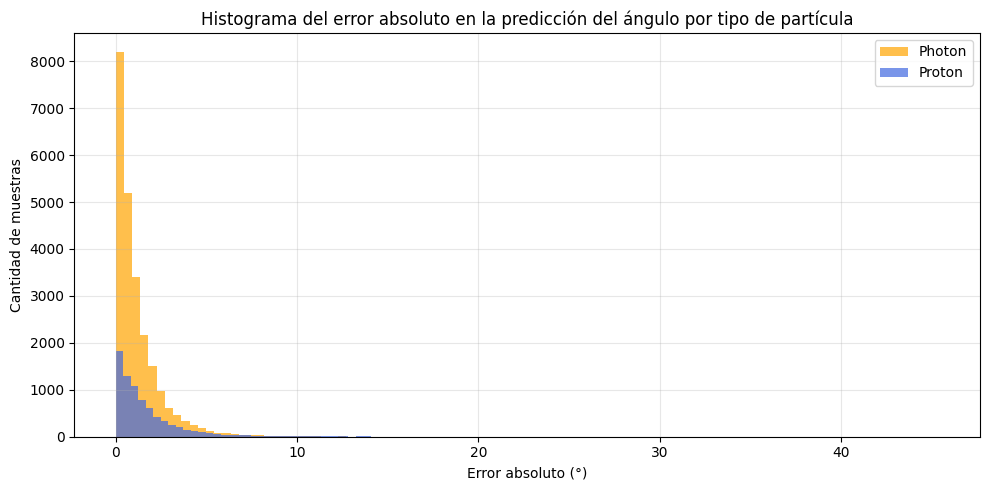

In [49]:
error_angle = np.abs(y_pred_angle - y_angle_test)

plt.figure(figsize=(10, 5))
plt.hist(error_angle[y_label_test == 1], bins=100, alpha=0.7, label='Photon', color='orange')
plt.hist(error_angle[y_label_test == 0], bins=100, alpha=0.7, label='Proton', color='royalblue')
plt.xlabel('Error absoluto (°)')
plt.ylabel('Cantidad de muestras')
plt.title('Histograma del error absoluto en la predicción del ángulo por tipo de partícula')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

C:\Users\Froxo\AppData\Local\Temp\ipykernel_14804\401867273.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_error, x='particle', y='error_angle', palette=['royalblue', 'orange'])


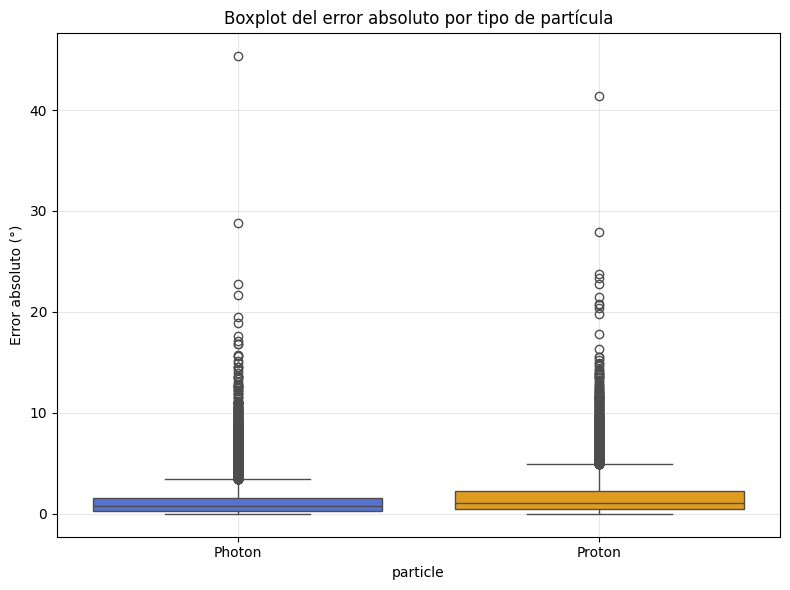

In [50]:
import pandas as pd
df_error = pd.DataFrame({
    'error_angle': error_angle,
    'particle': ['Photon' if l == 1 else 'Proton' for l in y_label_test]
})
plt.figure(figsize=(8, 6))
sns.boxplot(data=df_error, x='particle', y='error_angle', palette=['royalblue', 'orange'])
plt.ylabel('Error absoluto (°)')
plt.title('Boxplot del error absoluto por tipo de partícula')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

C:\Users\Froxo\AppData\Local\Temp\ipykernel_14804\3666996082.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  acc_by_angle_particle = df_acc_particle.groupby('angle').apply(
C:\Users\Froxo\AppData\Local\Temp\ipykernel_14804\3666996082.py:19: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  acc_by_angle_energy = df_acc_energy.groupby('angle').apply(


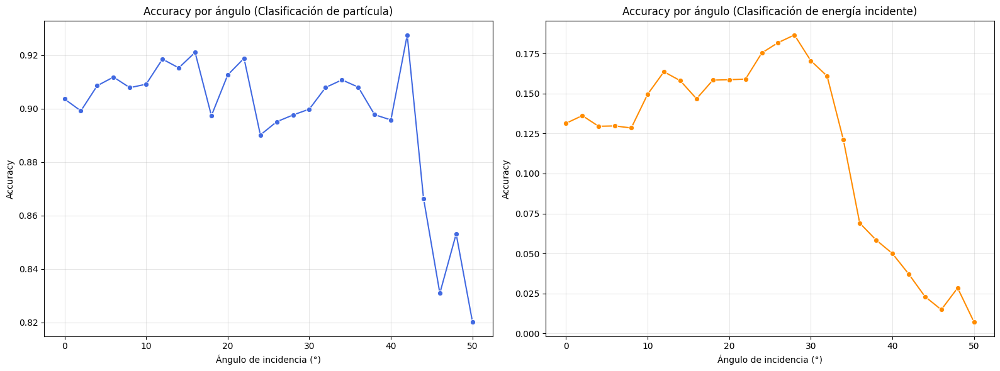

In [53]:
from sklearn.metrics import accuracy_score

# Accuracy por ángulo para clasificación de partícula
df_acc_particle = pd.DataFrame({
    'angle': y_angle_test,
    'true': y_label_test,
    'pred': y_pred_class_bin
})
acc_by_angle_particle = df_acc_particle.groupby('angle').apply(
    lambda df: accuracy_score(df['true'], df['pred'])
).reset_index(name='accuracy')

# Accuracy por ángulo para clasificación de energía incidente
df_acc_energy = pd.DataFrame({
    'angle': y_angle_test,
    'true': y_energy_test_bin,
    'pred': np.argmax(y_pred_energy, axis=1)
})
acc_by_angle_energy = df_acc_energy.groupby('angle').apply(
    lambda df: accuracy_score(df['true'], df['pred'])
).reset_index(name='accuracy')

plt.figure(figsize=(16, 6))

plt.subplot(1, 2, 1)
sns.lineplot(data=acc_by_angle_particle, x='angle', y='accuracy', marker='o', color='royalblue')
plt.xlabel('Ángulo de incidencia (°)')
plt.ylabel('Accuracy')
plt.title('Accuracy por ángulo (Clasificación de partícula)')
plt.grid(alpha=0.3)

plt.subplot(1, 2, 2)
sns.lineplot(data=acc_by_angle_energy, x='angle', y='accuracy', marker='o', color='darkorange')
plt.xlabel('Ángulo de incidencia (°)')
plt.ylabel('Accuracy')
plt.title('Accuracy por ángulo (Clasificación de energía incidente)')
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

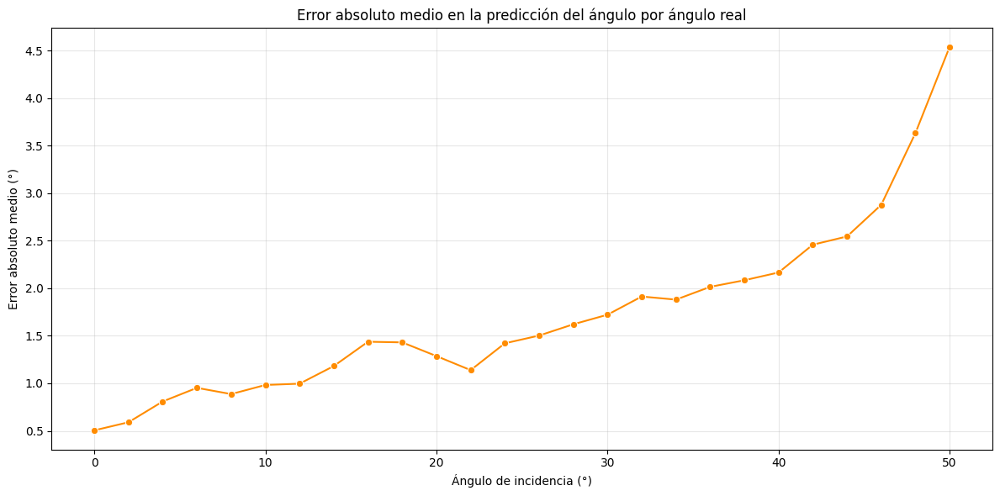

In [54]:
error_angle = np.abs(y_pred_angle - y_angle_test)

df_error_angle = pd.DataFrame({
    'angle': y_angle_test,
    'error': error_angle
})
mean_error_by_angle = df_error_angle.groupby('angle')['error'].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(data=mean_error_by_angle, x='angle', y='error', marker='o', color='darkorange')
plt.xlabel('Ángulo de incidencia (°)')
plt.ylabel('Error absoluto medio (°)')
plt.title('Error absoluto medio en la predicción del ángulo por ángulo real')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [58]:
import numpy as np

# Nombres de las features
feature_names = ['detector_id', 'particle_count', 't_bin', 'total_energy']

# Base accuracy
y_pred_class = model_multi.predict({'seq_input': X_test})[0].ravel()
y_pred_class_bin = (y_pred_class > 0.5).astype(int)
base_acc = np.mean(y_pred_class_bin == y_label_test)

importances = []
for i, fname in enumerate(feature_names):
    X_test_permuted = X_test.copy()
    # Permuta la columna i en todas las secuencias
    for seq in X_test_permuted:
        np.random.shuffle(seq[:, i])
    # Predice con la entrada permutada
    y_pred_perm = model_multi.predict({'seq_input': X_test_permuted})[0].ravel()
    y_pred_perm_bin = (y_pred_perm > 0.5).astype(int)
    perm_acc = np.mean(y_pred_perm_bin == y_label_test)
    importances.append(base_acc - perm_acc)



987/987 [==============================] - 8s 9ms/step


C:\Users\Froxo\AppData\Local\Temp\ipykernel_14804\3198663008.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_names, y=importances, palette='mako')


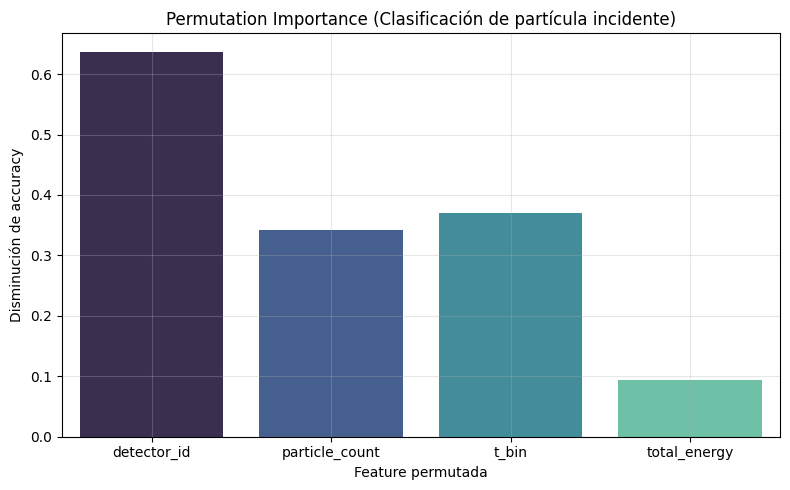

In [59]:
plt.figure(figsize=(8, 5))
sns.barplot(x=feature_names, y=importances, palette='mako')
plt.ylabel('Disminución de accuracy')
plt.xlabel('Feature permutada')
plt.title('Permutation Importance (Clasificación de partícula incidente)')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

987/987 [==============================] - 8s 8ms/step


C:\Users\Froxo\AppData\Local\Temp\ipykernel_14804\1295593693.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_names, y=importances_mae, palette='mako')


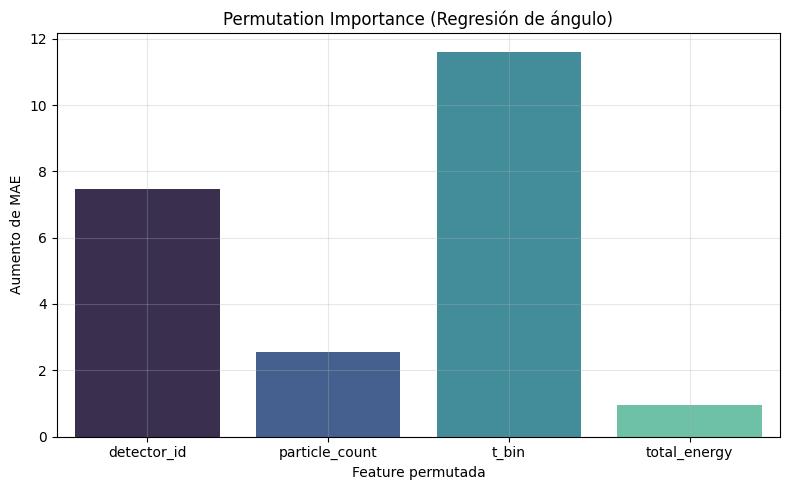

In [60]:
# Permutation Importance para regresión angular (usando aumento de MAE)
feature_names = ['detector_id', 'particle_count', 't_bin', 'total_energy']

# Base MAE
y_pred_angle = model_multi.predict({'seq_input': X_test})[1].ravel()
base_mae = np.mean(np.abs(y_pred_angle - y_angle_test))

importances_mae = []
for i, fname in enumerate(feature_names):
    X_test_permuted = X_test.copy()
    for seq in X_test_permuted:
        np.random.shuffle(seq[:, i])
    y_pred_perm = model_multi.predict({'seq_input': X_test_permuted})[1].ravel()
    perm_mae = np.mean(np.abs(y_pred_perm - y_angle_test))
    importances_mae.append(perm_mae - base_mae)

plt.figure(figsize=(8, 5))
sns.barplot(x=feature_names, y=importances_mae, palette='mako')
plt.ylabel('Aumento de MAE')
plt.xlabel('Feature permutada')
plt.title('Permutation Importance (Regresión de ángulo)')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

987/987 [==============================] - 9s 10ms/step


C:\Users\Froxo\AppData\Local\Temp\ipykernel_14804\1579480600.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_names, y=importances_energy, palette='mako')


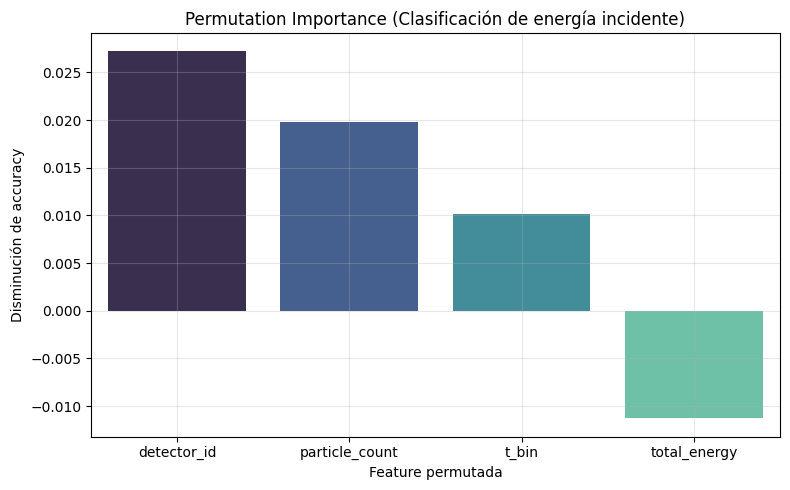

In [64]:
# Permutation Importance para clasificación de energía incidente (usando disminución de accuracy)
feature_names = ['detector_id', 'particle_count', 't_bin', 'total_energy']

# Base accuracy
y_pred_energy = model_multi.predict({'seq_input': X_test})[2]
y_pred_energy_bin = np.argmax(y_pred_energy, axis=1)  # Convert probabilities to class indices
base_acc = np.mean(y_pred_energy_bin == y_energy_test_bin)

importances_energy = []
for i, fname in enumerate(feature_names):
    X_test_permuted = X_test.copy()
    for seq in X_test_permuted:
        np.random.shuffle(seq[:, i])
    y_pred_perm = model_multi.predict({'seq_input': X_test_permuted})[2]
    y_pred_perm_bin = np.argmax(y_pred_perm, axis=1)  # Convert probabilities to class indices
    perm_acc = np.mean(y_pred_perm_bin == y_energy_test_bin)
    importances_energy.append(base_acc - perm_acc)

plt.figure(figsize=(8, 5))
sns.barplot(x=feature_names, y=importances_energy, palette='mako')
plt.ylabel('Disminución de accuracy')
plt.xlabel('Feature permutada')
plt.title('Permutation Importance (Clasificación de energía incidente)')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()